Our group_14 use the file reviews_electronics.14.json.

In [14]:
import nltk
import re

In [8]:
# import json

# with open('reviews_electronics.json/reviews_electronics.14.json') as f:
#     data = json.load(f)
# df = pd.DataFrame(data)

In [9]:
# df = pd.read_json('reviews_electronics.14.json')

In [10]:
import io
import ijson
import pandas as pd
import datetime

cols = ["reviewerID", "asin", "reviewerName", "helpful_start",
        "helpful_end", "reviewText", "overall", "summary",
        "unixReviewTime", "reviewTime"]

reviewerID = []
asin = []
reviewerName = []
helpful_start = []
helpful_end = []
reviewText = []
overall = []
summary = []
unixReviewTime = []
reviewTime = []
helpful = []

a = datetime.datetime.now()

with open('reviews_electronics.14.json', encoding="UTF-8") as json_file:
    cursor = 0
    for line_number, line in enumerate(json_file):
        #print ("Processing line", line_number + 1,"at cursor index:", cursor)
        line_as_file = io.StringIO(line)
        # Use a new parser for each line
        json_parser = ijson.parse(line_as_file)
        for prefix, type, value in json_parser:
            if (type == 'string') | (type == 'number'):
                if prefix.strip() == 'reviewerID':
                    reviewerID.append(value)
                    #print(value)
                elif prefix.strip() == 'asin':
                    asin.append(value)
                elif prefix.strip() == 'reviewerName':
                    reviewerName.append(value)
                elif prefix.strip() == 'helpful.item':
                    helpful.append(value)
                elif prefix.strip() == 'reviewText':
                    reviewText.append(value)
                elif prefix.strip() == 'overall':
                    overall.append(value)
                elif prefix.strip() == 'summary':
                    summary.append(value)
                elif prefix.strip() == 'unixReviewTime':
                    unixReviewTime.append(value)
                elif prefix.strip() == 'reviewTime':
                    reviewTime.append(value)
        cursor += len(line)

        
b = datetime.datetime.now()
       
helpful_start = [helpful[i] for i in range(len(helpful)) if i%2 == 0]
helpful_end = [helpful[i] for i in range(len(helpful)) if i%2 == 1]

review = pd.DataFrame(list(zip(reviewerID, asin, reviewerName, helpful_start, helpful_end,
                           reviewText, overall, summary, unixReviewTime, reviewTime)),
               columns =cols)
c=b-a
print(c.seconds)

58


In [8]:
review.shape

(494626, 10)

In [88]:
review.head(10)

,reviewerID,asin,reviewerName,helpful_start,helpful_end,reviewText,overall,summary,unixReviewTime,reviewTime
0,AKM1MP6P0OYPR,0132793040,"Vicki Gibson ""momo4""",1,1,Corey Barker does a great job of explaining Bl...,5.0,Very thorough,1365811200,"04 13, 2013"
1,A2TFB3AZSR5V7Z,B0096TK65A,lgtrellis,5,7,I received my product in record time and was p...,5.0,Great product!,1353024000,"11 16, 2012"
2,AJ3AH84Q6T1EW,B0096TK65A,Linda Biddy,40,42,I was not using my Kindle Fire HD as a laptop ...,5.0,Great Case,1351555200,"10 30, 2012"
3,A2UTERY8CGOXBR,B0096TK65A,Linda Dillman,5,5,Keyboard will not pair. Totally useless. So ...,1.0,Bluetooth keyboard,1357603200,"01 8, 2013"
4,AW9VZU00UNJQS,B0096TK65A,Linda LaMar,0,0,"Easy on, easy off. Perfect fit. Easy to use. O...",4.0,Looks great,1368576000,"05 15, 2013"
5,A3GNHKO8229Y35,B0096TK65A,Linda Raykowski,0,0,"This case exceeded my expectations, It fit my ...",5.0,A perfect fit!,1356652800,"12 28, 2012"
6,A2QAZJAM3F90DD,B0096TK65A,Linda Waters,0,0,Keyboard easy to pair/setup and works well. On...,4.0,Good keyboard,1393977600,"03 5, 2014"
7,A3SYWHCWOI17KQ,B0096TK65A,"LKB ""java junkie""",1,1,I love this case! It looks good and it works w...,5.0,Great product! Just as advertised!,1391558400,"02 5, 2014"
8,A2E3TOCL7KEHDQ,B0096TK65A,L. Knebl,1,2,Unfortunately I have the first edition of Kind...,5.0,Keyboard for Kindle Fire,1354838400,"12 7, 2012"
9,A3HGA3547SFQ8M,B0096TK65A,L. Lee P.,2,4,Received email requesting review so here it is...,1.0,Difficult to judge - still hasn't arrived!,1357603200,"01 8, 2013"


In [9]:
reviewcopy = review.copy()

In [10]:
review["reviewText"][0]

'Corey Barker does a great job of explaining Blend Modes in this DVD. All of the Kelby training videos are great but pricey to buy individually. If you really want bang for your buck just subscribe to Kelby Training online.'

# 1&2. Convert reviewText to lower case. After handling negation, remove stop words and stem all words. 

In [11]:
# Convert reviewText to lower case
reviewdoc = review["reviewText"].str.lower()
reviewdoc.head()

0    corey barker does a great job of explaining bl...
1    i received my product in record time and was p...
2    i was not using my kindle fire hd as a laptop ...
3    keyboard will not pair.  totally useless.  so ...
4    easy on, easy off. perfect fit. easy to use. o...
Name: reviewText, dtype: object

In [21]:
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english')) 
stop_words

{'a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'ain',
 'all',
 'am',
 'an',
 'and',
 'any',
 'are',
 'aren',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 'couldn',
 "couldn't",
 'd',
 'did',
 'didn',
 "didn't",
 'do',
 'does',
 'doesn',
 "doesn't",
 'doing',
 'don',
 "don't",
 'down',
 'during',
 'each',
 'few',
 'for',
 'from',
 'further',
 'had',
 'hadn',
 "hadn't",
 'has',
 'hasn',
 "hasn't",
 'have',
 'haven',
 "haven't",
 'having',
 'he',
 'her',
 'here',
 'hers',
 'herself',
 'him',
 'himself',
 'his',
 'how',
 'i',
 'if',
 'in',
 'into',
 'is',
 'isn',
 "isn't",
 'it',
 "it's",
 'its',
 'itself',
 'just',
 'll',
 'm',
 'ma',
 'me',
 'mightn',
 "mightn't",
 'more',
 'most',
 'mustn',
 "mustn't",
 'my',
 'myself',
 'needn',
 "needn't",
 'no',
 'nor',
 'not',
 'now',
 'o',
 'of',
 'off',
 'on',
 'once',
 'only',
 'or',
 'other',
 'our',
 'ours',
 'ourselves',
 'out',
 'over',
 'own',
 'r

In [9]:
"no" in stop_words

True

In [10]:
"not" in stop_words

True

Negation words must be handled before removing stop words, because "not" would be regarded as a stop word and be removed in the process.

Words like "don't" would be splited into "do" & "n't" by the function word_tokenize(), so we treat "n't" the same as "not".

In [22]:
from nltk.tokenize import word_tokenize 
from nltk.stem import PorterStemmer
ps = PorterStemmer()

In [23]:
reviewdoccopy = reviewdoc.copy()

In [24]:
len(reviewdoccopy) # 3000 records - 15 sec ------1min - 12000 records

494626

In [14]:
494626/3000

164.87533333333334

In [25]:
reviewdoc = reviewdoccopy.copy()

In [55]:
# reviewdoc = reviewdoc[0:500]

In [58]:
# wordcount = pd.DataFrame([])
# for i in range(1):
#     wordlist = []
#     for j in range(i*500,i*500+500): #0~3000 3000~6000, 6000~9000 9000~12000
#         onereview = reviewdoc[j]
#         print(onereview+"\n")
#         onereview = re.sub("n't +"," not_", re.sub("no +"," no_", re.sub("not +"," not_",onereview) ) )
#         print(onereview+"\n")
#         onereview = re.sub(r"\W", " ", onereview)
#         print(onereview+"\n")
#         word_tokens = word_tokenize(onereview)
#         print(word_tokens)
#         filtered_sentence = [ps.stem(w) for w in word_tokens if not w in stop_words]
#         print(filtered_sentence)
#         reviewdoc[j] = ' '.join(word for word in filtered_sentence)
#         print(reviewdoc[j])
#         wordlist = wordlist+filtered_sentence
#         print(wordlist)
#     wordcount3000 = pd.DataFrame(pd.Series(wordlist).value_counts(), columns = ['doc{}_to_{}'.format(i*5,i*5+5)])
#     wordcount = pd.merge(wordcount,wordcount3000,how = 'outer', left_index=True, right_index = True)
#     print('doc{} to doc{} finished'.format(i*5,min(len(reviewdoc),i*5+5)))

In [49]:
filtered_sentence

['radio',
 'ok',
 'instal',
 'two',
 'week',
 'thing',
 'not_lik',
 'detach',
 'face',
 'pop',
 'ride',
 'road',
 'play',
 'great',
 'sound',
 'great']

In [48]:
wordlist

['good',
 'speaker',
 'dick',
 'need',
 'flash',
 'memori',
 'fm',
 'tuner',
 'option',
 'second',
 'speaker',
 'plug',
 'would',
 'given',
 'anoth',
 'star',
 'flash',
 'memori',
 'availablear',
 'toni',
 'nice',
 'sound',
 'great',
 'price',
 'worth',
 'money',
 'pay',
 'tower',
 'buy',
 'eye',
 'close',
 'okay',
 'price',
 'disappoint',
 'sound',
 'review',
 'said',
 'sound',
 'amaz',
 'beg',
 'differ',
 'heard',
 'littl',
 'handheld',
 'speaker',
 'sound',
 'way',
 'better',
 'price',
 'got',
 'daughter',
 'game',
 'room',
 'downstair',
 'disappoint',
 'move',
 'bedroom',
 'like',
 'said',
 'price',
 'decent',
 'not_a',
 'great',
 'review',
 'read',
 'craig',
 'system',
 'work',
 'well',
 'comput',
 'pod',
 'thanx',
 'quick',
 'servic',
 'good',
 'merchandis',
 'thanx',
 'ace03',
 '50',
 'speaker',
 'worth',
 'attract',
 'bluetooth',
 'connect',
 'work',
 'well',
 'even',
 'work',
 'one',
 'level',
 'hous',
 'speaker',
 'howev',
 'no_bass',
 'speaker',
 'no_audiophil',
 'would',
 '

In [28]:
wordcount = pd.DataFrame([])
for i in range(165):
    wordlist = []
    for j in range(i*3000,min(len(reviewdoccopy),i*3000+3000)): #0~3000 3000~6000, 6000~9000 9000~12000
        onereview = reviewdoc[j]
        onereview = re.sub("n't +"," not_", re.sub("no +"," no_", re.sub("not +"," not_",onereview) ) )
        onereview = re.sub(r"\W", " ", onereview)
        word_tokens = word_tokenize(onereview)
        filtered_sentence = [ps.stem(w) for w in word_tokens if not w in stop_words]
        reviewdoc[j] = ' '.join(word for word in filtered_sentence)
        wordlist = wordlist+filtered_sentence
    wordcount3000=pd.DataFrame(pd.Series(wordlist).value_counts(),columns=['doc{}_to_{}'.format(i*3000,min(len(reviewdoccopy),i*3000+3000))])
    wordcount = pd.merge(wordcount,wordcount3000,how = 'outer', left_index=True, right_index = True)
    print('doc{} to doc{} finished'.format(i*3000,min(len(reviewdoccopy),i*3000+3000)))

doc0 to doc3000 finished
doc3000 to doc6000 finished
doc6000 to doc9000 finished
doc9000 to doc12000 finished
doc12000 to doc15000 finished
doc15000 to doc18000 finished
doc18000 to doc21000 finished
doc21000 to doc24000 finished
doc24000 to doc27000 finished
doc27000 to doc30000 finished
doc30000 to doc33000 finished
doc33000 to doc36000 finished
doc36000 to doc39000 finished
doc39000 to doc42000 finished
doc42000 to doc45000 finished
doc45000 to doc48000 finished
doc48000 to doc51000 finished
doc51000 to doc54000 finished
doc54000 to doc57000 finished
doc57000 to doc60000 finished
doc60000 to doc63000 finished
doc63000 to doc66000 finished
doc66000 to doc69000 finished
doc69000 to doc72000 finished
doc72000 to doc75000 finished
doc75000 to doc78000 finished
doc78000 to doc81000 finished
doc81000 to doc84000 finished
doc84000 to doc87000 finished
doc87000 to doc90000 finished
doc90000 to doc93000 finished
doc93000 to doc96000 finished
doc96000 to doc99000 finished
doc99000 to doc10200

In [69]:
# wordcount = wordcount.copy()

In [29]:
wordcount_result = pd.DataFrame(wordcount.sum(axis=1), columns = ["Freq"]).sort_values("Freq", ascending= False).reset_index()

In [30]:
wordcount_result

,index,Freq
0,use,237289.0
1,work,193912.0
2,case,175407.0
3,great,171475.0
4,one,167965.0
...,...,...
146812,no_batch,1.0
146813,clicked,1.0
146814,clickedit,1.0
146815,no_basepl,1.0


# 4. Create frequency count table for all word stems in all reviews. Use the most frequent 500 words to define the word vector. Create a bag-of-word vector representation for each review in electronics

In [79]:
# The top 500 words over all the reviewText
top500words = wordcount_result.loc[0:499, "index"].to_list()

In [95]:
column500 = ["Word_" + word for word in top500words] # prepare corresponding column names for bag_of_word

In [200]:
#  too slow
# firstword = []
# start = timeit.default_timer()
# for i in range(10000):
#     firstword.append(word_tokenize(reviewdoc[i]).count(top500words[0]))
# stop = timeit.default_timer()
# print('Time: ', stop - start) 9.185783500011894

Time:  9.185783500011894


In [260]:
start = timeit.default_timer()
bag_of_word = []

for i in range(len(reviewdoc)):
    onedoc = word_tokenize(reviewdoc[i])
    for j in range(500):
        bag_of_word.append(onedoc.count(top500words[j]))
    print("No. "+str(i)+" doc Finished")
stop = timeit.default_timer()
print('Time: ', stop - start)  # 774 s

No. 0 doc Finished
No. 1 doc Finished
No. 2 doc Finished
No. 3 doc Finished
No. 4 doc Finished
No. 5 doc Finished
No. 6 doc Finished
No. 7 doc Finished
No. 8 doc Finished
No. 9 doc Finished
No. 10 doc Finished
No. 11 doc Finished
No. 12 doc Finished
No. 13 doc Finished
No. 14 doc Finished
No. 15 doc Finished
No. 16 doc Finished
No. 17 doc Finished
No. 18 doc Finished
No. 19 doc Finished
No. 20 doc Finished
No. 21 doc Finished
No. 22 doc Finished
No. 23 doc Finished
No. 24 doc Finished
No. 25 doc Finished
No. 26 doc Finished
No. 27 doc Finished
No. 28 doc Finished
No. 29 doc Finished
No. 30 doc Finished
No. 31 doc Finished
No. 32 doc Finished
No. 33 doc Finished
No. 34 doc Finished
No. 35 doc Finished
No. 36 doc Finished
No. 37 doc Finished
No. 38 doc Finished
No. 39 doc Finished
No. 40 doc Finished
No. 41 doc Finished
No. 42 doc Finished
No. 43 doc Finished
No. 44 doc Finished
No. 45 doc Finished
No. 46 doc Finished
No. 47 doc Finished
No. 48 doc Finished
No. 49 doc Finished
No. 50 doc

In [266]:
# Convert the list of frequency count to a data frame
start1 = timeit.default_timer()
bag_of_word_df = pd.DataFrame(np.array(bag_of_word).reshape(494626,500), columns = column500)
stop1 = timeit.default_timer()
print('Time: ', stop1 - start1)

Time:  31.91201000000001


Verify the bag_of_word result by comparing with the previous wordcount_result

In [285]:
bag_of_word_df["Word_use"].sum()

237289

In [288]:
bag_of_word_df["Word_work"].sum()

193912

In [289]:
bag_of_word_df["Word_case"].sum()

175407

In [287]:
wordcount_result.head()

,index,Freq
0,use,237289.0
1,work,193912.0
2,case,175407.0
3,great,171475.0
4,one,167965.0


# 5. Establish a method for measuring the distance between different reviews. Print the mutual distance between the first 100 reviews (review IDs) to screen, sorted from closest to furthest.

In [420]:
import gensim
from gensim.models import Word2Vec
from sklearn.decomposition import PCA
from matplotlib import pyplot as plt

In [381]:
doc100 = reviewdoc[0:100].copy()
docindex = [["Doc" + str(index+1) for index in range(100)]]

In [382]:
Distance = pd.DataFrame([],index = docindex, columns = docindex)
Distance.shape

(100, 100)

In [383]:
Distance.head(3)

,Doc1,Doc2,Doc3,Doc4,Doc5,Doc6,Doc7,Doc8,Doc9,Doc10,...,Doc91,Doc92,Doc93,Doc94,Doc95,Doc96,Doc97,Doc98,Doc99,Doc100
Doc1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Doc2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Doc3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [384]:
sentences = [str(doc).split() for doc in doc100]

In [385]:
start = timeit.default_timer()
model = gensim.models.Word2Vec(sentences, min_count=1)
stop = timeit.default_timer()
print('Time: ', stop - start)

Time:  0.4741238999995403


In [388]:
for i in range(100):
    for j in range(100):
        Distance.iloc[i,j] = model.wv.wmdistance(sentences[i],sentences[j])
        print("finished:"+str(i)+", "+str(j))

finished:0, 0
finished:0, 1
finished:0, 2
finished:0, 3
finished:0, 4
finished:0, 5
finished:0, 6
finished:0, 7
finished:0, 8
finished:0, 9
finished:0, 10
finished:0, 11
finished:0, 12
finished:0, 13
finished:0, 14
finished:0, 15
finished:0, 16
finished:0, 17
finished:0, 18
finished:0, 19
finished:0, 20
finished:0, 21
finished:0, 22
finished:0, 23
finished:0, 24
finished:0, 25
finished:0, 26
finished:0, 27
finished:0, 28
finished:0, 29
finished:0, 30
finished:0, 31
finished:0, 32
finished:0, 33
finished:0, 34
finished:0, 35
finished:0, 36
finished:0, 37
finished:0, 38
finished:0, 39
finished:0, 40
finished:0, 41
finished:0, 42
finished:0, 43
finished:0, 44
finished:0, 45
finished:0, 46
finished:0, 47
finished:0, 48
finished:0, 49
finished:0, 50
finished:0, 51
finished:0, 52
finished:0, 53
finished:0, 54
finished:0, 55
finished:0, 56
finished:0, 57
finished:0, 58
finished:0, 59
finished:0, 60
finished:0, 61
finished:0, 62
finished:0, 63
finished:0, 64
finished:0, 65
finished:0, 66
finis

In [389]:
Distance

,Doc1,Doc2,Doc3,Doc4,Doc5,Doc6,Doc7,Doc8,Doc9,Doc10,...,Doc91,Doc92,Doc93,Doc94,Doc95,Doc96,Doc97,Doc98,Doc99,Doc100
Doc1,0,0.0382148,0.0374832,0.038123,0.0394731,0.0371229,0.039203,0.0383287,0.0383899,0.0366564,...,0.0348959,0.0360822,0.0392297,0.0395712,0.0363116,0.0377084,0.0373255,0.0363268,0.0390667,0.0364515
Doc2,0.0382148,0,0.0300006,0.0338548,0.0389996,0.0286846,0.0342196,0.0326305,0.0336766,0.0368968,...,0.036556,0.0297861,0.033792,0.0343334,0.0363801,0.0335771,0.0357987,0.0365243,0.0338874,0.0312465
Doc3,0.0374832,0.0300006,0,0.0345844,0.0366723,0.0262917,0.0340715,0.0323907,0.0294137,0.0374429,...,0.0305438,0.0340082,0.0320306,0.036499,0.032275,0.0341187,0.0309724,0.0323837,0.0264989,0.0363726
Doc4,0.038123,0.0338548,0.0345844,0,0.0395723,0.0353609,0.0350708,0.0351266,0.0345448,0.0378453,...,0.0361821,0.0370948,0.0367155,0.0363634,0.0358992,0.0355177,0.0370276,0.0351163,0.0367506,0.0345153
Doc5,0.0394731,0.0389996,0.0366723,0.0395723,0,0.0349672,0.0339039,0.0363613,0.0364694,0.0378411,...,0.0341941,0.0369376,0.0386392,0.0357124,0.037176,0.0383006,0.0310841,0.0390924,0.0360719,0.0373802
Doc6,0.0371229,0.0286846,0.0262917,0.0353609,0.0349672,0,0.0325815,0.0284895,0.0316629,0.0346644,...,0.0316828,0.0302006,0.0342583,0.0349754,0.0318348,0.03446,0.0318815,0.0272365,0.0275356,0.0328919
Doc7,0.039203,0.0342196,0.0340715,0.0350708,0.0339039,0.0325815,0,0.0326068,0.0356156,0.0377281,...,0.0323078,0.0365669,0.0359239,0.036241,0.0346442,0.0367456,0.0333038,0.0339873,0.0330769,0.0343415
Doc8,0.0383287,0.0326305,0.0323907,0.0351266,0.0363613,0.0284895,0.0326068,0,0.034534,0.0347333,...,0.0344998,0.0311836,0.0359275,0.0344899,0.0320653,0.0338773,0.0350793,0.0294339,0.0319536,0.0348701
Doc9,0.0383899,0.0336766,0.0294137,0.0345448,0.0364694,0.0316629,0.0356156,0.034534,0,0.0381875,...,0.0352117,0.0318503,0.0323535,0.0364217,0.03358,0.0345301,0.0273844,0.0349529,0.0312541,0.0385882
Doc10,0.0366564,0.0368968,0.0374429,0.0378453,0.0378411,0.0346644,0.0377281,0.0347333,0.0381875,0,...,0.0340073,0.0374559,0.0374426,0.0388245,0.0342699,0.0358853,0.0385166,0.0365864,0.037228,0.0358886


In [404]:
Distance_pair = pd.DataFrame([])

In [409]:
for i in range(100):
    for j in range(i+1,100):
        Distance_pair = pd.concat([Distance_pair, pd.DataFrame({'doc1': i,'doc2': j,'distance': Distance.iloc[i,j]}, index = [i])])
        print("finished"+str(i)+", "+str(j))

finished0, 1
finished0, 2
finished0, 3
finished0, 4
finished0, 5
finished0, 6
finished0, 7
finished0, 8
finished0, 9
finished0, 10
finished0, 11
finished0, 12
finished0, 13
finished0, 14
finished0, 15
finished0, 16
finished0, 17
finished0, 18
finished0, 19
finished0, 20
finished0, 21
finished0, 22
finished0, 23
finished0, 24
finished0, 25
finished0, 26
finished0, 27
finished0, 28
finished0, 29
finished0, 30
finished0, 31
finished0, 32
finished0, 33
finished0, 34
finished0, 35
finished0, 36
finished0, 37
finished0, 38
finished0, 39
finished0, 40
finished0, 41
finished0, 42
finished0, 43
finished0, 44
finished0, 45
finished0, 46
finished0, 47
finished0, 48
finished0, 49
finished0, 50
finished0, 51
finished0, 52
finished0, 53
finished0, 54
finished0, 55
finished0, 56
finished0, 57
finished0, 58
finished0, 59
finished0, 60
finished0, 61
finished0, 62
finished0, 63
finished0, 64
finished0, 65
finished0, 66
finished0, 67
finished0, 68
finished0, 69
finished0, 70
finished0, 71
finished0, 72
f

In [455]:
Distance_pair["document1"] = [reviewdoc[i] for i in Distance_pair["doc1"]]
Distance_pair["document2"] = [reviewdoc[i] for i in Distance_pair["doc2"]]

Distance_pair["score1"] = [float(review.loc[i,"overall"]) for i in Distance_pair["doc1"]]
Distance_pair["score2"] = [float(review.loc[i,"overall"]) for i in Distance_pair["doc2"]]
Distance_pair["score_diff"] = abs(Distance_pair["score1"]-Distance_pair["score2"])

In [466]:
Distance_pair = Distance_pair.sort_values("distance")
Distance_pair.reset_index(inplace = True)

In [484]:
Distance_pair = Distance_pair.drop(columns = ['index'])
Distance_pair.head(10)

,doc1,doc2,distance,document1,document2,score1,score2,score_diff
0,12,40,0.020500,purchas product son go new kindl fire hd love ...,son purchas case keyboard kindl fire work grea...,5.0,4.0,1.0
1,5,47,0.022549,case exceed expect fit kindl fire hd perfectli...,kindl fire hd fit perfectli simpli instruct co...,5.0,5.0,0.0
2,6,52,0.022668,keyboard easi pair setup work well drawback ke...,great kindl use easi pair devic smaller keyboa...,4.0,5.0,1.0
3,5,40,0.023656,case exceed expect fit kindl fire hd perfectli...,son purchas case keyboard kindl fire work grea...,5.0,4.0,1.0
4,12,27,0.024013,purchas product son go new kindl fire hd love ...,purchas bluetooth keyboard kindl fire hd 7 34 ...,5.0,5.0,0.0
5,5,12,0.024321,case exceed expect fit kindl fire hd perfectli...,purchas product son go new kindl fire hd love ...,5.0,5.0,0.0
6,5,27,0.024723,case exceed expect fit kindl fire hd perfectli...,purchas bluetooth keyboard kindl fire hd 7 34 ...,5.0,5.0,0.0
7,2,43,0.024954,not_us kindl fire hd laptop got case easi type...,nice case kindl hd love keyboard type email me...,5.0,5.0,0.0
8,40,91,0.025376,son purchas case keyboard kindl fire work grea...,love fact turn kindl fire mini comput look gre...,4.0,5.0,1.0
9,34,80,0.025403,love conveni eas keyboard wish would closur li...,absolut love item would recommend product anyo...,5.0,5.0,0.0


In [472]:
(Distance_pair).shape

(4950, 9)

In [469]:
Distance_pair.loc[0:1000,"score_diff"].mean()

0.7442557442557443

In [474]:
Distance_pair.loc[1000:2000,"score_diff"].mean()

1.124875124875125

In [475]:
Distance_pair.loc[2000:3000,"score_diff"].mean()

1.4675324675324675

In [476]:
Distance_pair.loc[3000:4000,"score_diff"].mean()

1.6823176823176824

In [477]:
Distance_pair.loc[4000:len(Distance_pair),"score_diff"].mean()

1.9378947368421053

In [457]:
Distance_pair[["distance","score_diff"]].corr()

,distance,score_diff
distance,1.000000,0.293062
score_diff,0.293062,1.000000


# 6. Run a PCA and graph the first two PCs for the first 100 reviews. Does your graph reflect your findings from the previous exercise?

In [379]:
#model300000 = model

In [418]:
# fit a 2d PCA model to the vectors
X = model[model.wv.vocab]
pca = PCA(n_components=2)
result = pca.fit_transform(X)

E:\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  


In [441]:
result.shape

(1031, 2)

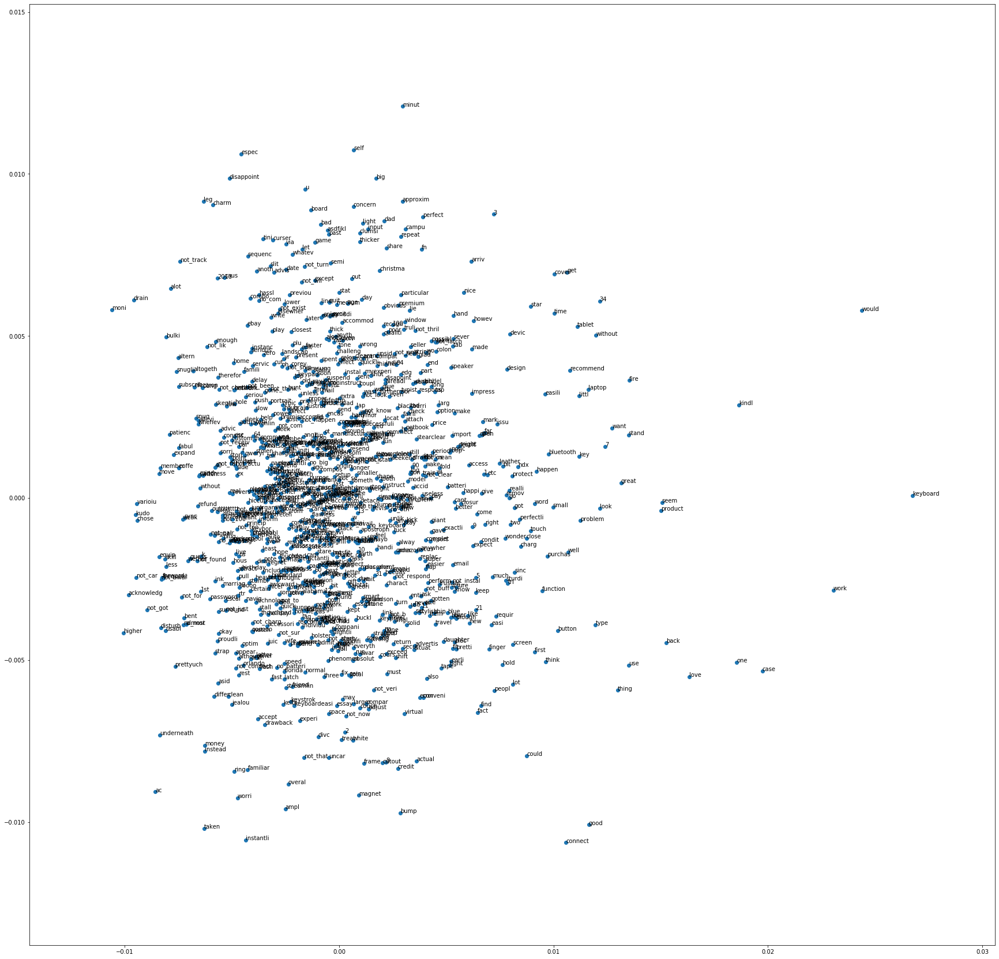

In [444]:
# create a scatter plot of the projection
plt.figure(figsize=(30,30))
plt.scatter(result[:, 0], result[:, 1])
words = list(model.wv.vocab)
for i, word in enumerate(words):
    plt.annotate(word, xy=(result[i, 0], result[i, 1]))
plt.show()

In [100]:
wordcount_result.to_csv("wordcount_result.csv")

# 8. Perform a lasso logistic regression and measure the out-of-sample accuracy of your method of choice. 

In [6]:
from sklearn.metrics import make_scorer
from sklearn.model_selection import cross_val_score
import mord
import numpy as np

In [12]:
review_df = pd.DataFrame(review)
bow_df = pd.DataFrame(bag_of_word)
X_transformed = bow_df.append(review_df.loc[:,3:5],ignore_index=True, sort=False)

NameError: name 'bag_of_word' is not defined

In [7]:
def acc_fun(target_true, target_fit):
    target_fit = np.round(target_fit)
    target_fit.astype('int')
    return accuracy_score(target_true, target_fit)

acc = make_scorer(acc_fun)
model_ordinal = mord.LogisticAT(alpha=1)
folds = 3
ACC_ordinal = cross_val_score(model_ordinal,
    X_transformed,
    Y,
    cv=folds,
    scoring=acc)
print('Ordinal logistic regression prediction accuracy: ', np.mean(ACC_ordinal))

NameError: name 'X_transformed' is not defined

# 9. Implement a method to aggregate reviews by product.  Can you use any of the other columns to help with aggregation?  Explain why or why not.  Please clearly explain your method. 


In [ ]:
df8 = pd.concat([df8, bow_df], axis=1)
df8 = pd.concat([df8, summary_bow_df], axis=1)
df8 = df8.dropna()

review_vector = df8.drop(columns=["overall"]).iloc[:,0:503]
colnames = review_vector.columns
aggregated_vectors = pd.DataFrame()
for i in range(len(coefs)):
    aggregated_vectors[colnames[i]] = review_vector[colnames[i]] * coefs[i]

asins = pd.DataFrame(review_df["asin"])
aggregated_vectors = pd.merge(aggregated_vectors, asins, left_index=True, right_index=True)
colnames = list(aggregated_vectors.columns.values)
colnames.pop(-1)
aggregated_vectors = aggregated_vectors.groupby('asin')[colnames].mean()

# 10. Establish a method for measuring the distance between different products.


In [ ]:
result_matrix=pd.DataFrame(
    squareform(pdist(aggregate_vectors)),
    columns = asin,
    index = asin
)
result_matrix